<a href="https://colab.research.google.com/github/antoniocruzds/Data-Analysis/blob/master/AnaliseCovid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Explorando Dados


In [ ]:
#Instalando o Geopandas
!pip install geopandas

     |████████████████████████████████| 972kB 4.5MB/s 
     |████████████████████████████████| 10.9MB 13.0MB/s 
     |████████████████████████████████| 14.7MB 298kB/s 


In [ ]:
#Importando e renomeando o pandas e o geopandas
import pandas as pd
import geopandas as gpd

In [ ]:
#Importando os arquivos e colocando em um dataframe
municipios = pd.read_csv('/content/drive/My Drive/visualização de dados/brasil-municipios.csv')
idhm = pd.read_csv('/content/drive/My Drive/visualização de dados/atlas2013_dadosbrutos_idhm_pt.csv')
covid = pd.read_excel('/content/drive/My Drive/visualização de dados/HIST_PAINEL_COVIDBR_13ago2020.xlsx') # dados de 13/08 #leu em excel

In [ ]:
#Analisando as 5 primeiras linhas do df municipios
municipios.head()

,codigo_ibge,nome,latitude,longitude,capital,codigo_uf
0,5200050,Abadia de Goiás,-16.75730,-49.4412,0,52
1,3100104,Abadia dos Dourados,-18.48310,-47.3916,0,31
2,5200100,Abadiânia,-16.19700,-48.7057,0,52
3,3100203,Abaeté,-19.15510,-45.4444,0,31
4,1500107,Abaetetuba,-1.72183,-48.8788,0,15


In [ ]:
#Analisando as 5 primeiras linhas do df idhm
idhm.head()

,,,,ANO;UF;Codmun6;Codmun7;Município;IDHM;IDHM_E;IDHM_L;IDHM_R
2010;11;110001;1100015;ALTA FLORESTA D'OESTE;0,641;0,526;0,763;0,657
2010;11;110002;1100023;ARIQUEMES;0,702;0,600;0,806;0,716
2010;11;110003;1100031;CABIXI;0,650;0,559;0,757;0,650
2010;11;110004;1100049;CACOAL;0,718;0,620;0,821;0,727
2010;11;110005;1100056;CEREJEIRAS;0,692;0,602;0,799;0,688


Atraves da analise dessas primeiras linhas, podemos observar que o separador do arquivo é com ";", e o decimal está como ",". logo, precisamos informar ao python; #Usaremos sep=';', decimal=','


In [ ]:
#'refazendo' o df idhm, agora indicando o separador e o decimal
idhm = idhm = pd.read_csv('/content/drive/My Drive/visualização de dados/atlas2013_dadosbrutos_idhm_pt.csv', sep=';', decimal=',')

In [ ]:
idhm.head()

,ANO,UF,Codmun6,Codmun7,Município,IDHM,IDHM_E,IDHM_L,IDHM_R
0,2010,11,110001,1100015,ALTA FLORESTA D'OESTE,0.641,0.526,0.763,0.657
1,2010,11,110002,1100023,ARIQUEMES,0.702,0.600,0.806,0.716
2,2010,11,110003,1100031,CABIXI,0.650,0.559,0.757,0.650
3,2010,11,110004,1100049,CACOAL,0.718,0.620,0.821,0.727
4,2010,11,110005,1100056,CEREJEIRAS,0.692,0.602,0.799,0.688


In [ ]:
#Analisando as primeiras linhas do df covid
covid.head(30)

,regiao,estado,municipio,coduf,codmun,codRegiaoSaude,nomeRegiaoSaude,data,semanaEpi,populacaoTCU2019,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos,interior/metropolitana
0,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-25,9,210147125,0,0,0,0,NaN,NaN,NaN
1,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-26,9,210147125,1,1,0,0,NaN,NaN,NaN
2,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-27,9,210147125,1,0,0,0,NaN,NaN,NaN
3,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-28,9,210147125,1,0,0,0,NaN,NaN,NaN
4,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-29,9,210147125,2,1,0,0,NaN,NaN,NaN
5,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-03-01,10,210147125,2,0,0,0,NaN,NaN,NaN
6,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-03-02,10,210147125,2,0,0,0,NaN,NaN,NaN
7,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-03-03,10,210147125,2,0,0,0,NaN,NaN,NaN
8,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-03-04,10,210147125,3,1,0,0,NaN,NaN,NaN
9,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-03-05,10,210147125,7,4,0,0,NaN,NaN,NaN


Aqui, vemos que existem dados NaN nas colunas de estado e municipio, o que provavelmente deve indicar dados mais gerais sobre a Covid. Como queremos analisar dados por municipio, iremos remover os dados com NaN na coluna municipio;


In [ ]:
#eliminando as informações ausentes
covid.dropna(subset='municipio', inplace=True) #no df covid, eliminando da coluna municipio, no df original

TypeError: ignored

Deu erro pois precisamos informar a coluna em forma de lista. #[ ]

In [ ]:
#eliminando as informações ausentes
covid.dropna(subset=['municipio'], inplace=True) #no df covid, eliminando da coluna municipio, no df original

In [ ]:
#Lendo as primeiras linhas do df covid novamente pra verificar a retirada dos NaN
covid.head()

,regiao,estado,municipio,coduf,codmun,codRegiaoSaude,nomeRegiaoSaude,data,semanaEpi,populacaoTCU2019,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos,interior/metropolitana
4928,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-27,13,22945,0,0,0,0,NaN,NaN,0.0
4929,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-28,13,22945,0,0,0,0,NaN,NaN,0.0
4930,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-29,14,22945,0,0,0,0,NaN,NaN,0.0
4931,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-30,14,22945,0,0,0,0,NaN,NaN,0.0
4932,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-31,14,22945,0,0,0,0,NaN,NaN,0.0


Agora vamos explorar as informações dos conjuntos de dados com info e describe


In [ ]:
#Informações como os tipos de variaveis e o espaço usado na memoria
municipios.info()

In [ ]:
municipios.describe() #Informações estatisticas (Nesse df ñ são tao importantes)

In [ ]:
#Informações como os tipos de variaveis e o espaço usado na memoria
idhm.info()

In [ ]:
idhm.describe() #Informações estatisticas

In [ ]:
#Informações como os tipos de variaveis e o espaço usado na memoria
covid.info()

In [ ]:
covid.describe() #Informações estatisticas (Nesse df ñ são tao importantes)

Analisando melhor as informações obitidas com o .describe, podemos notar que valores minimos nas colunas de casosNovos e ObitosNotvos, estão em negativo. precisamos analisar melhor para ver o que podemos descobrir e isso não interfira em nossas futuras visualizações;

In [ ]:
#Ordenando o df pela coluna de casos novos para analisar melhor
covid.sort_values('casosNovos')

,regiao,estado,municipio,coduf,codmun,codRegiaoSaude,nomeRegiaoSaude,data,semanaEpi,populacaoTCU2019,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos,interior/metropolitana
168446,Nordeste,RN,Natal,24,240810.0,24007.0,7ª REGIAO DE SAUDE - METROPOLITANA,2020-08-12,33,884122,21140,-901,878,12,NaN,NaN,1.0
23368,Norte,AM,Tefé,13,130420.0,13008.0,TRIANGULO,2020-07-05,28,59849,2878,-443,80,0,NaN,NaN,0.0
733044,Centro-Oeste,MT,Campo Verde,51,510267.0,51013.0,SUL MATOGROSSENSE,2020-07-21,30,44041,153,-403,13,0,NaN,NaN,0.0
733039,Centro-Oeste,MT,Campo Verde,51,510267.0,51013.0,SUL MATOGROSSENSE,2020-07-16,29,44041,140,-381,10,0,NaN,NaN,0.0
457608,Sudeste,RJ,Niterói,33,330330.0,33006.0,METROPOLITANA II,2020-05-26,22,513584,1692,-349,92,3,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
542625,Sudeste,SP,São Paulo,35,355030.0,35016.0,SAO PAULO,2020-07-02,27,12252023,134984,5656,7370,112,NaN,NaN,1.0
542652,Sudeste,SP,São Paulo,35,355030.0,35016.0,SAO PAULO,2020-07-29,31,12252023,188827,6800,9396,155,NaN,NaN,1.0
542612,Sudeste,SP,São Paulo,35,355030.0,35016.0,SAO PAULO,2020-06-19,25,12252023,105407,6877,6255,158,NaN,NaN,1.0
542666,Sudeste,SP,São Paulo,35,355030.0,35016.0,SAO PAULO,2020-08-12,33,12252023,224140,6896,10311,90,NaN,NaN,1.0


No caso acima, alguns dados estão em negativo, mas isso não será levado em conta na analise que faremos.

#Identificando os tipos de variáveis em nosso conjunto de dados: 

váriavéis podem ser qualitativas ou quantitativas:

1. QUALITATIVAS, ou seja, não mensuradas numericamente, podem ser em:
* escala ordinal(em 
ordem)
* nominal(não pode ser hierarquizada)
* intervalar(pode quntificar a diferença)

2.  QUANTITATIVAS, ou seja, Mensuraveis, podendo ser:
* Discretas(finito ou enumerável)
* Contínua(com intervalos ou união de numeros reais)
  
  

#Variáveis em nossos dados:
1. **Covid**:
* Variáveis qualitativas
** *Ordinal*: coduf, codmun, codRegiaoSaude, semanaEpi, FgMetro;
** *Nominal*: regiao, estado, municipio, nomeRegiaoSaude;
* *Variáveis* quantitativas
** Discretas: casosAcumulado, casosNovos, obitosAcumulado, obitosNovos;
** *Contínuas*: -

2. **IDMH**
* Variáveis qualitativas
** *Ordinal*: ANO, UF, Codmun6, Codmun7;
** *Nominal*: Municipio
* Variáveis quantitativas
** *Discretas*: -
** *Contínuas*: IDHM, IDHM_E, IDHM_L, IDHM_R



In [ ]:
#Lendo o shapefile dos municipios do brasil com os dados geometricos p/ plotar o mapa
br_municipios = gpd.read_file('/content/drive/My Drive/visualização de dados/br_municipios (1).zip (Unzipped Files)/BR_Municipios_2019.shp')

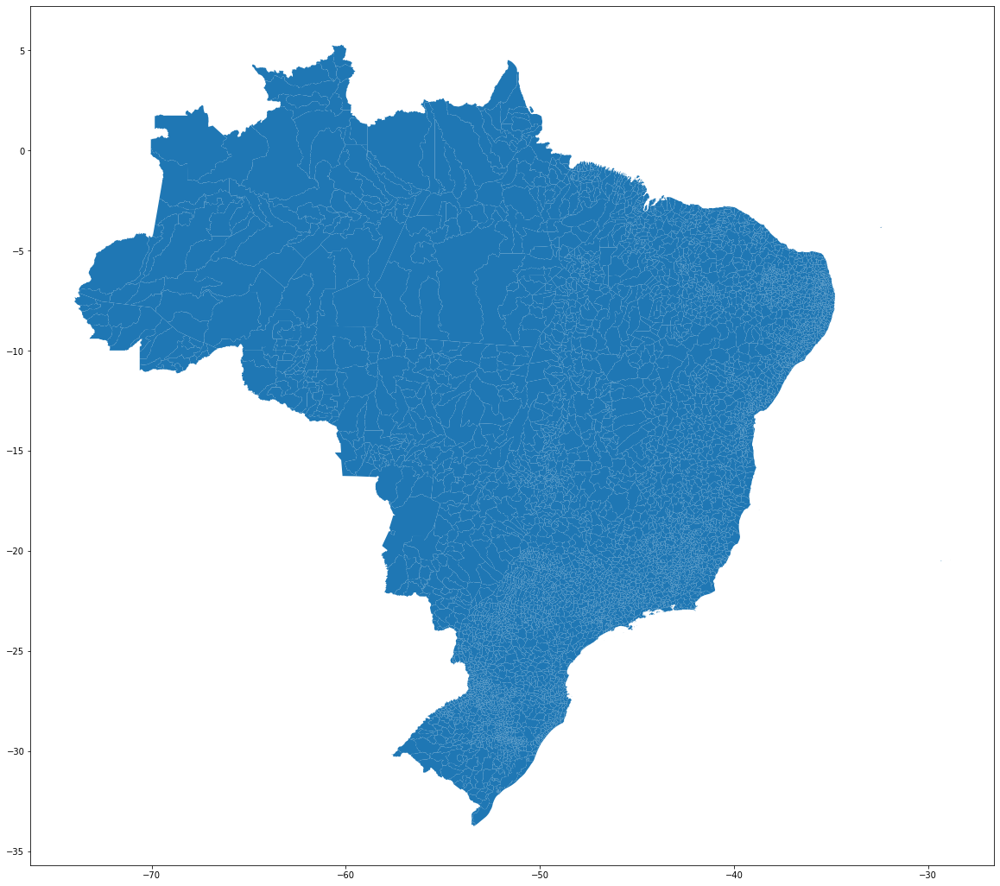

In [ ]:
#Plotando um mapa com os municipios
br_municipios.plot(figsize=(20, 20)) #Plotando em um tamanho de 20x20

Agora iremos colorir o mapa como um mapa de calor e declarar as informações que queremos plotar no grafico

# Analisando e separando as informações que usaremos:

In [ ]:
#Primeiro lendo o geodf e identificando as informações que iremos agregar com o merge
br_municipios.head()

,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry
0,1100015,Alta Floresta D'Oeste,RO,7067.025,"POLYGON ((-62.22630 -11.89037, -62.20670 -11.8..."
1,1100023,Ariquemes,RO,4426.571,"POLYGON ((-63.58751 -9.84984, -63.58715 -9.849..."
2,1100031,Cabixi,RO,1314.352,"POLYGON ((-60.71834 -13.39058, -60.70904 -13.3..."
3,1100049,Cacoal,RO,3792.892,"POLYGON ((-61.50114 -11.30119, -61.50104 -11.2..."
4,1100056,Cerejeiras,RO,2783.300,"POLYGON ((-61.51346 -13.28575, -61.51534 -13.2..."


Vamos unir os dataframes usando as informações dos codigos: um tem codigo p/ municipio de 6 digitos, outro de 7 digitos e o outro os dois

In [ ]:
#Unindo os df
br_municipios_covid_idhm = br_municipios.merge(idhm,left_on='CD_MUN', right_on='Codmun7')


ValueError: ignored

Deu erro por conta do tipo do dado no df

In [ ]:
#Analisando o tipo de objeto da coluna que queremos(CD_MUN)
br_municipios.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   CD_MUN    5572 non-null   object  
 1   NM_MUN    5572 non-null   object  
 2   SIGLA_UF  5572 non-null   object  
 3   AREA_KM2  5572 non-null   float64 
 4   geometry  5572 non-null   geometry
dtypes: float64(1), geometry(1), object(3)
memory usage: 217.8+ KB


os dados estão colocados como object, e precisamos deles como números

In [ ]:
#Convertendo a coluna de object para int64
br_municipios.CD_MUN = br_municipios.CD_MUN.astype('int64')

In [ ]:
#Unindo os df
br_municipios_covid_idhm = br_municipios.merge(idhm,left_on='CD_MUN', right_on='Codmun7')

AInda precisamos unir as informações sobre a Covid

In [ ]:
#Criando uma coluna que indique a letalidade do covid
covid['letalidade'] = (covid['obitosAcumulado']/covid['casosAcumulado']).fillna(0) #Eliminando dados faltantes por 0

In [ ]:
#Organizando os casos de covid
covid_13_ago = covid[covid.data == pd.Timestamp('2020-08-13')] #armazenando as informações da data 13/08 na variavel
covid['data_format'] = covid['data'].dt.strftime('%d-%m') #Colocando as datas para dia e mês

In [ ]:
br_municipios_covid_idhm = br_municipios.merge(idhm,left_on='CD_MUN', right_on='Codmun7').merge(covid_13_ago,left_on='Codmun6',right_on='codmun')

In [ ]:
#Lendo o inicio do novo df
br_municipios_covid_idhm.head()

,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry,ANO,UF,Codmun6,Codmun7,Município,IDHM,IDHM_E,IDHM_L,IDHM_R,regiao,estado,municipio,coduf,codmun,codRegiaoSaude,nomeRegiaoSaude,data,semanaEpi,populacaoTCU2019,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos,interior/metropolitana,letalidade
0,1100015,Alta Floresta D'Oeste,RO,7067.025,"POLYGON ((-62.22630 -11.89037, -62.20670 -11.8...",2010,11,110001,1100015,ALTA FLORESTA D'OESTE,0.641,0.526,0.763,0.657,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-08-13,33,22945,389,1,4,1,NaN,NaN,0.0,0.010283
1,1100023,Ariquemes,RO,4426.571,"POLYGON ((-63.58751 -9.84984, -63.58715 -9.849...",2010,11,110002,1100023,ARIQUEMES,0.702,0.600,0.806,0.716,Norte,RO,Ariquemes,11,110002.0,11001.0,VALE DO JAMARI,2020-08-13,33,107863,3508,162,57,1,NaN,NaN,0.0,0.016249
2,1100031,Cabixi,RO,1314.352,"POLYGON ((-60.71834 -13.39058, -60.70904 -13.3...",2010,11,110003,1100031,CABIXI,0.650,0.559,0.757,0.650,Norte,RO,Cabixi,11,110003.0,11006.0,CONE SUL,2020-08-13,33,5312,67,0,4,0,NaN,NaN,0.0,0.059701
3,1100049,Cacoal,RO,3792.892,"POLYGON ((-61.50114 -11.30119, -61.50104 -11.2...",2010,11,110004,1100049,CACOAL,0.718,0.620,0.821,0.727,Norte,RO,Cacoal,11,110004.0,11002.0,CAFE,2020-08-13,33,85359,1205,16,19,0,NaN,NaN,0.0,0.015768
4,1100056,Cerejeiras,RO,2783.300,"POLYGON ((-61.51346 -13.28575, -61.51534 -13.2...",2010,11,110005,1100056,CEREJEIRAS,0.692,0.602,0.799,0.688,Norte,RO,Cerejeiras,11,110005.0,11006.0,CONE SUL,2020-08-13,33,16323,149,0,6,0,NaN,NaN,0.0,0.040268


# Plotando os mapas
mapas iniciais:

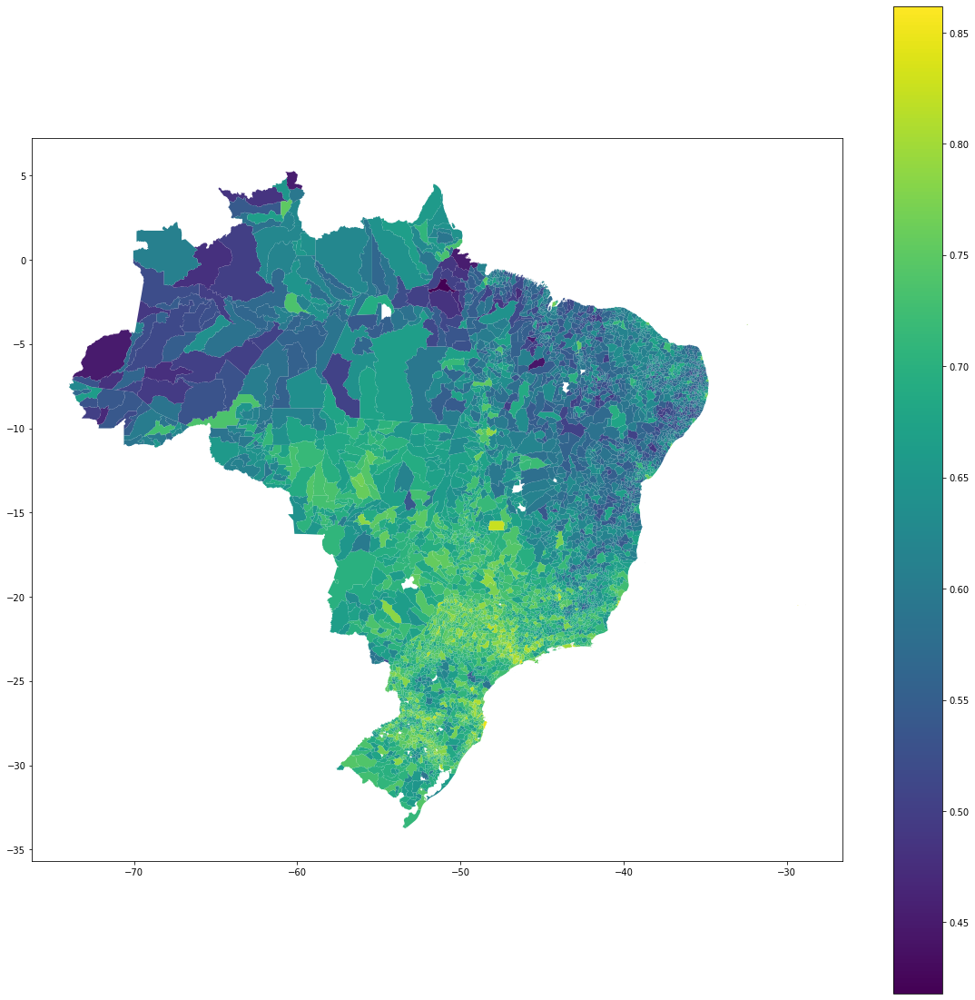

In [ ]:
#Mapa de calor por IDHM
br_municipios_covid_idhm.plot(column='IDHM', legend=True, figsize=(20,20))

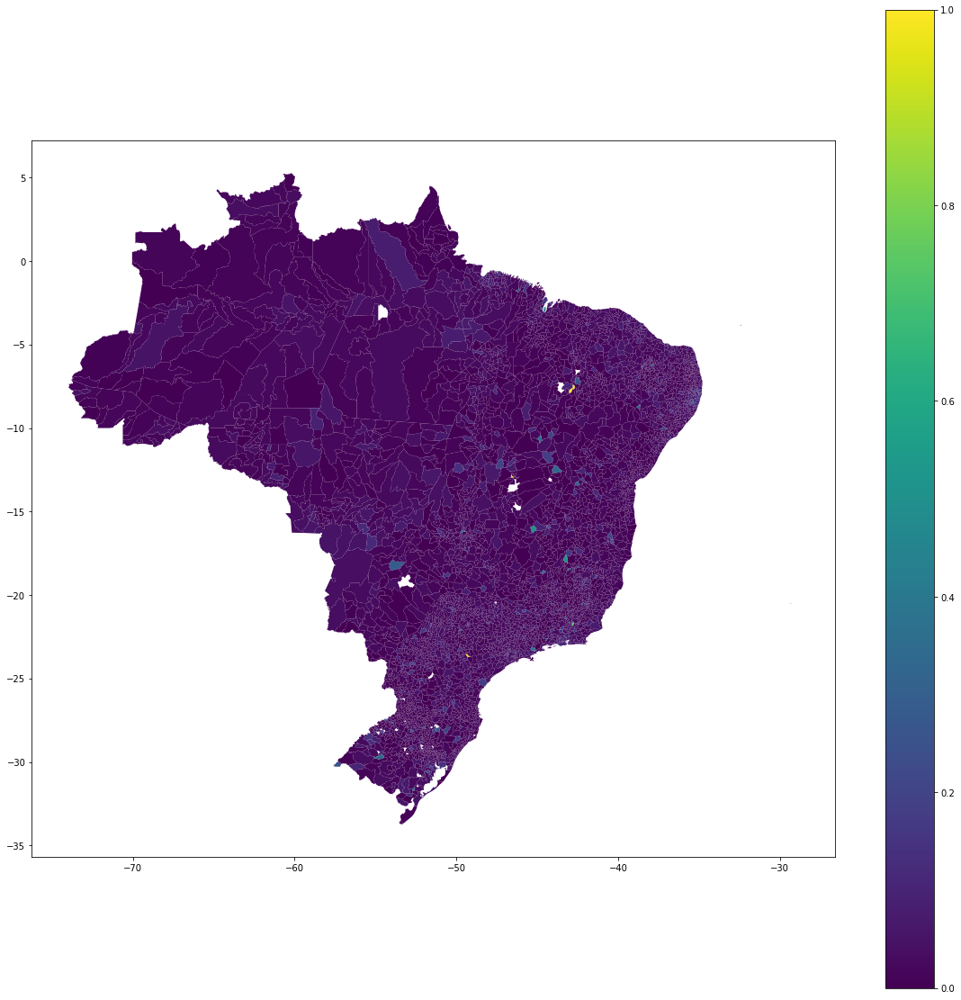

In [ ]:
#Gráfico de calor por letalidade
br_municipios_covid_idhm.plot(column='letalidade', legend=True, figsize=(20,20))

#Usando o plotly Express

https://plotly.com/python/plotly-express/#overview


In [ ]:
covid_municipios = covid.merge(idhm,left_on='codmun', right_on='Codmun6').merge(municipios,left_on='Codmun7',right_on='codigo_ibge')

In [ ]:
covid_municipios.head()

,regiao,estado,municipio,coduf,codmun,codRegiaoSaude,nomeRegiaoSaude,data,semanaEpi,populacaoTCU2019,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos,interior/metropolitana,letalidade,data_format,ANO,UF,Codmun6,Codmun7,Município,IDHM,IDHM_E,IDHM_L,IDHM_R,codigo_ibge,nome,latitude,longitude,capital,codigo_uf
0,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-27,13,22945,0,0,0,0,NaN,NaN,0.0,0.0,27-03,2010,11,110001,1100015,ALTA FLORESTA D'OESTE,0.641,0.526,0.763,0.657,1100015,Alta Floresta D'Oeste,-11.9283,-61.9953,0,11
1,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-28,13,22945,0,0,0,0,NaN,NaN,0.0,0.0,28-03,2010,11,110001,1100015,ALTA FLORESTA D'OESTE,0.641,0.526,0.763,0.657,1100015,Alta Floresta D'Oeste,-11.9283,-61.9953,0,11
2,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-29,14,22945,0,0,0,0,NaN,NaN,0.0,0.0,29-03,2010,11,110001,1100015,ALTA FLORESTA D'OESTE,0.641,0.526,0.763,0.657,1100015,Alta Floresta D'Oeste,-11.9283,-61.9953,0,11
3,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-30,14,22945,0,0,0,0,NaN,NaN,0.0,0.0,30-03,2010,11,110001,1100015,ALTA FLORESTA D'OESTE,0.641,0.526,0.763,0.657,1100015,Alta Floresta D'Oeste,-11.9283,-61.9953,0,11
4,Norte,RO,Alta Floresta D'Oeste,11,110001.0,11005.0,ZONA DA MATA,2020-03-31,14,22945,0,0,0,0,NaN,NaN,0.0,0.0,31-03,2010,11,110001,1100015,ALTA FLORESTA D'OESTE,0.641,0.526,0.763,0.657,1100015,Alta Floresta D'Oeste,-11.9283,-61.9953,0,11


In [ ]:
#Importanto o Plotly Express
import plotly.express as px

In [ ]:
#Plotando o mapa com a animação
obitosba = px.scatter_mapbox(covid_municipios[covid_municipios['estado']=='BA'], lat="latitude", lon="longitude", size="obitosAcumulado",
                 size_max=45, zoom=3, color='IDHM',
                 center={"lat": -13.3945273, "lon": -46.4799032},
                 mapbox_style="carto-positron",
                 animation_frame="data_format", hover_name='municipio', width=1200, height=800)

obitosba.show()

Aqui podemos observar um mapa animado sobre a Covid (na bahia), onde o tamanho das bolinhas = Obitos Acumulados; Cores = IDH por Mucicipio

In [ ]:
letalidadeBA= px.scatter(covid_municipios[covid_municipios['estado'] == 'BA'], x="obitosAcumulado", y="letalidade", size="casosAcumulado", color="IDHM",
                    hover_name='municipio', size_max=60, animation_group='municipio', animation_frame='data_format', range_y=[0 , 0.1], range_x=[0, 200])

letalidadeBA.show()

In [ ]:
#Comparando estados BA e PE
comparacao= px.scatter(covid_municipios[(covid_municipios['estado'] == 'BA') | (covid_municipios['estado'] == 'PE')], x="obitosAcumulado", y="letalidade", size="casosAcumulado", color="IDHM",
                    hover_name='municipio', size_max=60, animation_group='municipio', animation_frame='data_format', range_y=[0 , 0.3], range_x=[0, 500], facet_col="estado")

comparacao.show()

In [ ]:
regioes = px.scatter(covid_municipios[covid_municipios.data==pd.Timestamp('2020-08-13')], x="casosAcumulado", y="letalidade", size="obitosAcumulado",
           hover_name="municipio", size_max=60, facet_col="regiao",  color="IDHM",
            range_y=[-0.01,0.2], range_x=[-10000,300000])
regioes.show()

Agora vamos exportar os graficos para uma pagina HTML em um servidor local


In [ ]:
#Instalando o pacote
!pip install jupyter-dash

     |████████████████████████████████| 51kB 2.3MB/s 
     |████████████████████████████████| 71kB 4.9MB/s 
     |████████████████████████████████| 1.2MB 15.1MB/s 
     |████████████████████████████████| 3.4MB 29.3MB/s 
     |████████████████████████████████| 194kB 34.4MB/s 
     |████████████████████████████████| 1.8MB 39.4MB/s 
     |████████████████████████████████| 358kB 38.5MB/s 
  Created wheel for dash: filename=dash-1.14.0-cp36-none-any.whl size=80129 sha256=4fef56c4fb535d5e56f40874fde21ff16c83f03711b041e7547d31ef48b43d3d
  Stored in directory: /root/.cache/pip/wheels/1d/54/0b/e846f762d47e8abc9234419822d013dfb2ccf957b48e411dc6
  Created wheel for ansi2html: filename=ansi2html-1.5.2-cp36-none-any.whl size=13863 sha256=1378b1985187ef869251178fcf591df7e08740651e5dd1ebcee7e1a9a1c9f528
  Stored in directory: /root/.cache/pip/wheels/f9/ea/e0/1ed3c3945ce073f930f3e5aa2b9bbadb03cd2efc8f8695cd61
  Created wheel for flask-compress: filename=Flask_Compress-1.5.0-cp36-none-any.whl size=5273

In [ ]:
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html

In [ ]:
app = JupyterDash(__name__)
app.layout = html.Div([
    dcc.Graph(figure=obitosba),
    dcc.Graph(figure=letalidadeBA),
    dcc.Graph(figure=comparacao),
    dcc.Graph(figure=regioes) 

])

app.run_server(mode='external')

Dash app running on:


<IPython.core.display.Javascript object>